In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Perceptron
from sklearn.metrics import r2_score

In [3]:
from sklearn.datasets import make_classification

x, y = make_classification(
    n_samples=200,
    n_features=2,
    n_redundant=0,
    n_clusters_per_class=1,
    class_sep=2.0,    # makes data clearly separable
    random_state=42
)

In [4]:
x

array([[ 1.27071018e-01,  1.01304200e+00],
       [ 2.31293463e+00,  3.77053357e+00],
       [ 3.34042818e+00,  3.42099601e+00],
       [ 3.29454774e+00,  5.95619812e-01],
       [ 1.94410516e+00,  1.47724090e+00],
       [-1.11959689e+00,  1.50891314e+00],
       [ 1.15108470e+00,  1.81007677e+00],
       [-1.00745441e+00,  5.47157435e-01],
       [-2.25396925e+00,  1.06769236e+00],
       [-1.24392415e+00,  2.19979806e+00],
       [-2.92089280e+00,  3.91894990e+00],
       [-5.11937308e-01,  4.50578584e+00],
       [ 3.25751204e+00,  2.81515089e+00],
       [-4.12190908e+00,  1.62220145e+00],
       [ 2.87768113e+00,  1.51095984e+00],
       [-5.32144582e-01,  1.78719280e+00],
       [ 1.48404809e+00,  1.04843842e+00],
       [-1.54235518e+00,  4.49536942e+00],
       [ 2.04235818e+00,  2.10204918e+00],
       [ 2.63367133e+00,  1.59219328e+00],
       [ 2.85756778e+00,  2.73826470e+00],
       [-3.41167954e+00,  1.93790864e-01],
       [ 1.87481918e+00,  1.48815664e+00],
       [-9.

In [5]:
import seaborn as sns

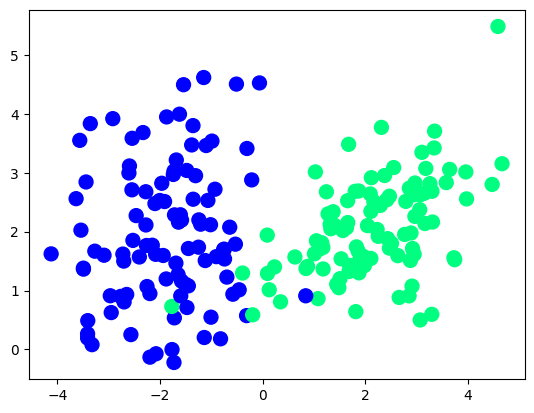

In [11]:
plt.scatter(x[: , 0] , x[: , 1] , c=y , cmap='winter',  s=100)

In [19]:
def step(z):
    return 1 if z >=0 else 0

In [20]:
def perceptron(x, y):
    x = np.insert(x , 0 , 1, axis=1)
    weights = np.ones(x.shape[1])
    lr = 0.1

    for i in range(1000):
        j = np.random.randint(0 , 200)
        y_hat = step(np.dot(x[j] , weights))
        weights = weights + lr * (y[j] - y_hat)*x[j]

    return weights[0] , weights[1:]


In [21]:
intercept_ , coef_ = perceptron(x, y)

In [22]:
print(intercept_)

0.40000000000000013


In [23]:
print(coef_)

[ 0.5079474  -0.28640532]


In [24]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [25]:
x_input = np.linspace(-3, 3, 200)
y_input = m*x_input + b

(-3.0, 2.0)

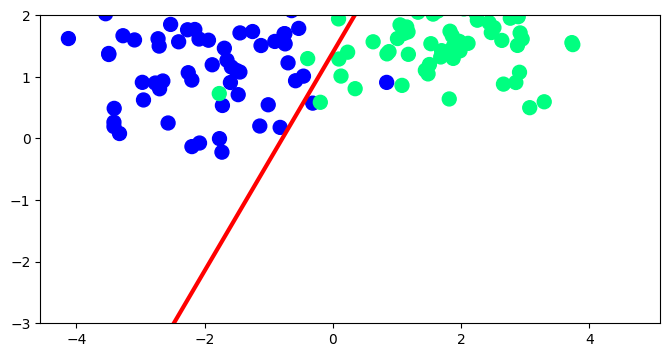

In [ ]:
plt.figure(figsize=(8, 4))
plt.plot(x_input, y_input, color='red', linewidth=3)
plt.scatter(x[:, 0], x[:, 1], c=y, cmap='winter', s=100)
plt.ylim(-3, 2)

In [34]:
def perceptron(X, y):

    m = []
    b = []

    X = np.insert(X, 0, 1, axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1

    for i in range(200):
        j = np.random.randint(0, 100)
        y_hat = step(np.dot(X[j], weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]

        m.append(-(weights[1]/weights[2]))
        b.append(-(weights[0]/weights[2]))

    return m, b

In [36]:
m, b = perceptron(x,y)

In [ ]:

%matplotlib inline
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(9, 5))
x_i = np.arange(-3, 3, 0.1)
ax.scatter(x[:, 0], x[:, 1], c=y, cmap='winter', s=100)
line, = ax.plot(x_i, x_i * m[0] + b[0], 'r-', linewidth=2)
plt.ylim(-3, 3)

def update(i):
    line.set_ydata(x_i * m[i] + b[i])
    ax.set_xlabel(f'epoch {i+1}')
    return (line,)            


anim = FuncAnimation(fig, update, frames=len(m), interval=100, repeat=True)


HTML(anim.to_jshtml())